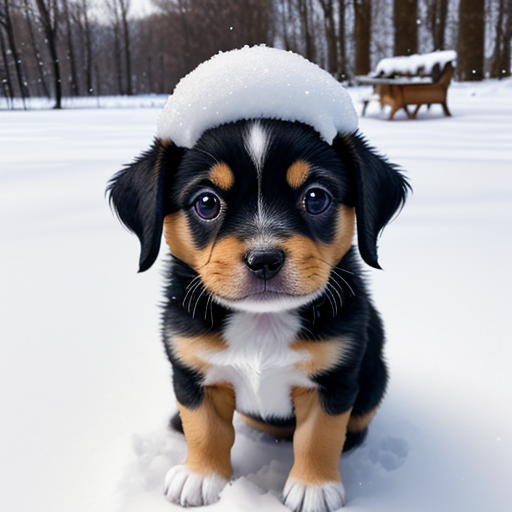

In [5]:
from urllib.request import urlopen
from PIL import Image

image = Image.open('./puppy.png').convert('RGB')
caption = 'a puppy playing in the snow'
image

In [6]:
from transformers import CLIPTokenizerFast, CLIPProcessor, CLIPModel

model_id = "openai/clip-vit-base-patch32"

# pre-process text
clip_tokenizer = CLIPTokenizerFast.from_pretrained(model_id)
# pre-process images
clip_processor = CLIPProcessor.from_pretrained(model_id)
model = CLIPModel.from_pretrained(model_id)

In [7]:
inputs = clip_tokenizer(caption, return_tensors="pt")
inputs

{'input_ids': tensor([[49406,   320,  6829,  1629,   530,   518,  2583, 49407]]), 'attention_mask': tensor([[1, 1, 1, 1, 1, 1, 1, 1]])}

In [8]:
clip_tokenizer.convert_ids_to_tokens(inputs["input_ids"][0])

['<|startoftext|>',
 'a</w>',
 'puppy</w>',
 'playing</w>',
 'in</w>',
 'the</w>',
 'snow</w>',
 '<|endoftext|>']

In [19]:
text_embedding = model.get_text_features(**inputs)
text_embedding.shape

torch.Size([1, 512])

In [10]:
processed_image = clip_processor(text=None, images=image, return_tensors="pt")["pixel_values"]

In [11]:
processed_image.shape

torch.Size([1, 3, 224, 224])

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers). Got range [-1.7922626..2.145897].


(-0.5, 223.5, 223.5, -0.5)

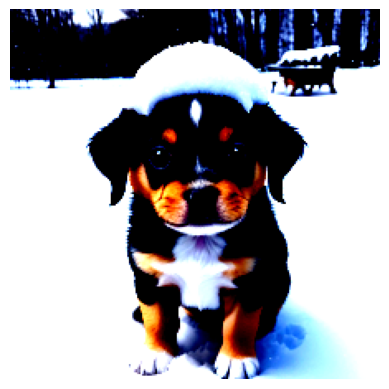

In [12]:
import torch
import numpy as np
import matplotlib.pyplot as plt

img = processed_image.squeeze(0)
img = img.permute(*torch.arange(img.ndim - 1, -1, -1))
img = np.einsum("ijk->jik", img)

plt.imshow(img)
plt.axis("off")

In [13]:
image_embedding = model.get_image_features(processed_image)
image_embedding.shape

torch.Size([1, 512])

In [21]:
text_embedding /= text_embedding.norm(dim=-1, keepdim=True)
image_embedding /= image_embedding.norm(dim=-1, keepdim=True)

text_embedding = text_embedding.detach().cpu().numpy()
image_embedding = image_embedding.detach().cpu().numpy()
score = np.dot(text_embedding, image_embedding.T)
score

array([[0.33149642]], dtype=float32)

In [22]:
# using sentence-transformers for CLIP make it much easier.
# from sentence_transformers import SentenceTransformer, util

# model = SentenceTransformer("clip-ViT-B-32")
# image_embeddings = model.encode(images)
# text_embeddings = model.encode(captions)
# sim_matrix = util.cos_sim(image_embeddings, text_embeddings)

In [25]:
from transformers import AutoProcessor, Blip2ForConditionalGeneration
import torch

blip_processor = AutoProcessor.from_pretrained("Salesforce/blip2-opt-2.7b")
model = Blip2ForConditionalGeneration.from_pretrained(
    "Salesforce/blip2-opt-2.7b",
    torch_dtype=torch.float16
)
device = "mps" if torch.mps.is_available() else "cpu"
model.to(device)

config.json:   0%|          | 0.00/1.03k [00:00<?, ?B/s]

model.safetensors.index.json:   0%|          | 0.00/122k [00:00<?, ?B/s]

model-00001-of-00002.safetensors:   0%|          | 0.00/10.0G [00:00<?, ?B/s]

model-00002-of-00002.safetensors:   0%|          | 0.00/4.98G [00:00<?, ?B/s]

Loading checkpoint shards:   0%|          | 0/2 [00:00<?, ?it/s]

generation_config.json:   0%|          | 0.00/141 [00:00<?, ?B/s]

Blip2ForConditionalGeneration(
  (vision_model): Blip2VisionModel(
    (embeddings): Blip2VisionEmbeddings(
      (patch_embedding): Conv2d(3, 1408, kernel_size=(14, 14), stride=(14, 14))
    )
    (encoder): Blip2Encoder(
      (layers): ModuleList(
        (0-38): 39 x Blip2EncoderLayer(
          (self_attn): Blip2Attention(
            (dropout): Dropout(p=0.0, inplace=False)
            (qkv): Linear(in_features=1408, out_features=4224, bias=True)
            (projection): Linear(in_features=1408, out_features=1408, bias=True)
          )
          (layer_norm1): LayerNorm((1408,), eps=1e-06, elementwise_affine=True)
          (mlp): Blip2MLP(
            (activation_fn): GELUActivation()
            (fc1): Linear(in_features=1408, out_features=6144, bias=True)
            (fc2): Linear(in_features=6144, out_features=1408, bias=True)
          )
          (layer_norm2): LayerNorm((1408,), eps=1e-06, elementwise_affine=True)
        )
      )
    )
    (post_layernorm): LayerNorm((

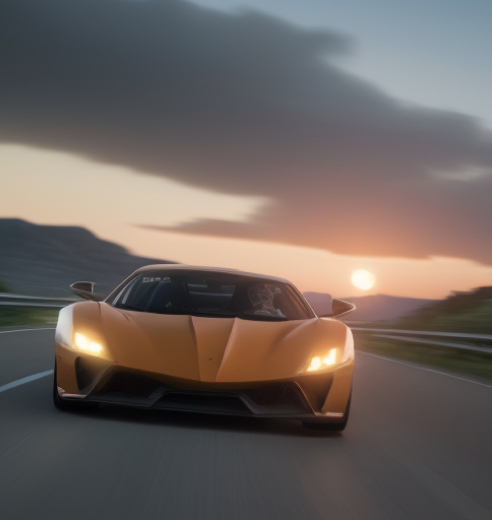

In [26]:
image = Image.open('./car.png').convert('RGB')
image

In [27]:
inputs = blip_processor(image, return_tensors="pt").to(device, torch.float16)
inputs["pixel_values"].shape

torch.Size([1, 3, 224, 224])

In [28]:
blip_processor.tokenizer

GPT2TokenizerFast(name_or_path='Salesforce/blip2-opt-2.7b', vocab_size=50265, model_max_length=1000000000000000019884624838656, is_fast=True, padding_side='right', truncation_side='right', special_tokens={'bos_token': '</s>', 'eos_token': '</s>', 'unk_token': '</s>', 'pad_token': '<pad>'}, clean_up_tokenization_spaces=False, added_tokens_decoder={
	1: AddedToken("<pad>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	2: AddedToken("</s>", rstrip=False, lstrip=False, single_word=False, normalized=True, special=True),
	50265: AddedToken("<image>", rstrip=False, lstrip=False, single_word=False, normalized=False, special=True),
}
)

In [29]:
# pre-process text
text = "I am drinking three wonderful cups of coffee today"
token_ids = blip_processor(image, text=text, return_tensors="pt")
token_ids = token_ids.to(device, torch.float16)["input_ids"][0]
token_ids

tensor([50265, 50265, 50265, 50265, 50265, 50265, 50265, 50265, 50265, 50265,
        50265, 50265, 50265, 50265, 50265, 50265, 50265, 50265, 50265, 50265,
        50265, 50265, 50265, 50265, 50265, 50265, 50265, 50265, 50265, 50265,
        50265, 50265,     2,   100,   524,  4835,   130,  4613, 12988,     9,
         3895,   452], device='mps:0')

In [30]:
# input ids -> tokens
tokens = blip_processor.tokenizer.convert_ids_to_tokens(token_ids)
tokens

['<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '</s>',
 'I',
 'Ġam',
 'Ġdrinking',
 'Ġthree',
 'Ġwonderful',
 'Ġcups',
 'Ġof',
 'Ġcoffee',
 'Ġtoday']

In [31]:
tokens = [token.replace("Ġ", "_") for token in tokens]
tokens

['<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '<image>',
 '</s>',
 'I',
 '_am',
 '_drinking',
 '_three',
 '_wonderful',
 '_cups',
 '_of',
 '_coffee',
 '_today']

In [34]:
def generate_text_from_image(image):
    # generate image ids to be passed to the decoder (LLM)
    inputs = blip_processor(image, return_tensors="pt").to(device, torch.float16)
    generated_ids = model.generate(**inputs, max_new_tokens=20)
    # generate text from image ids
    generated_text = blip_processor.batch_decode(generated_ids, skip_special_tokens=True)
    generated_text = generated_text[0].strip()
    return generated_text

generate_text_from_image(image)

'an orange supercar driving on the road at sunset'

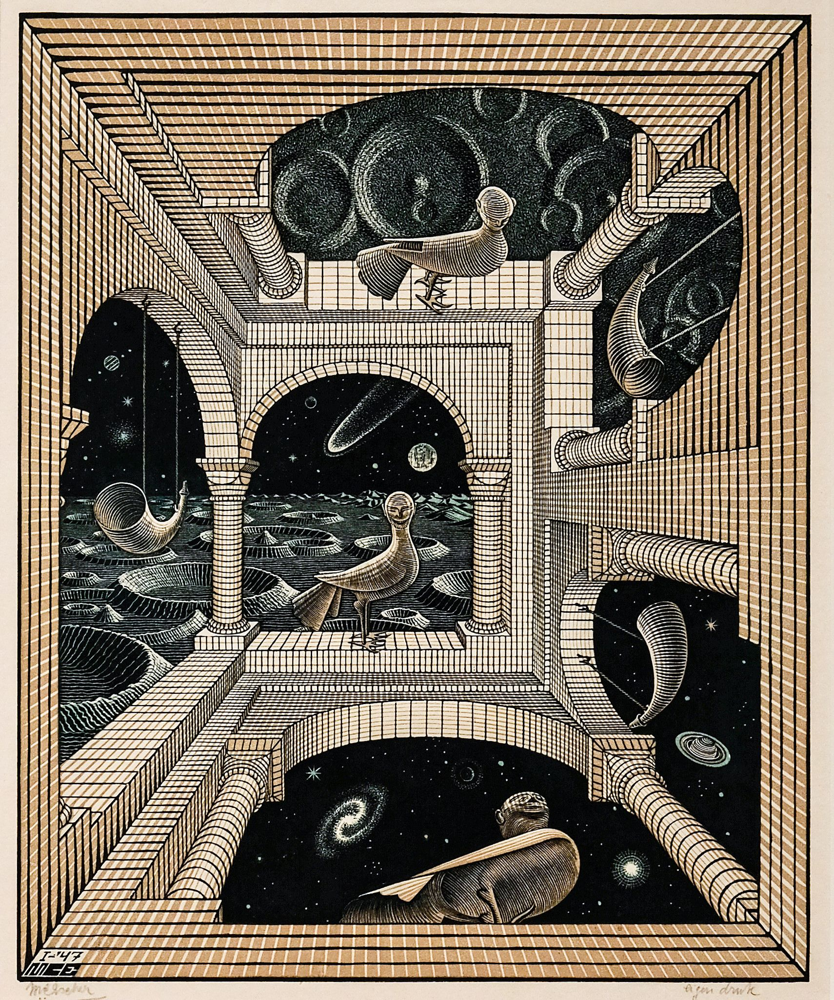

In [37]:
image = Image.open('./escher.jpg').convert('RGB')
image

In [38]:
generate_text_from_image(image)

'a drawing of a bird in a room with a bird in the sky'

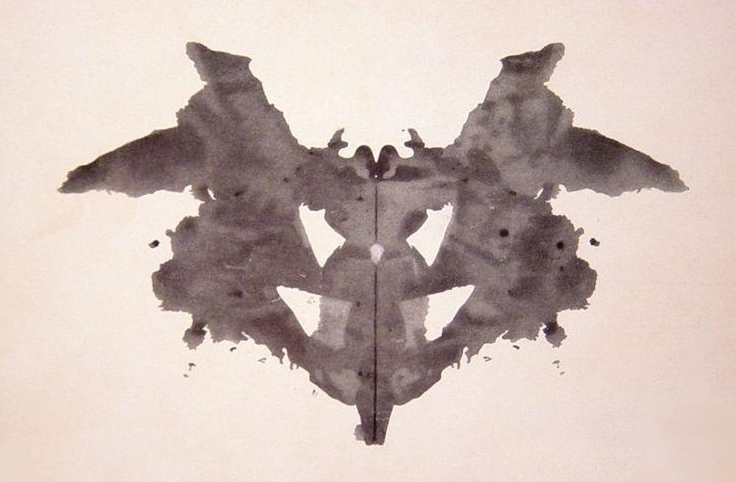

In [39]:
image = Image.open('./ink.jpg').convert('RGB')
image

In [40]:
generate_text_from_image(image)

'a black and white ink drawing of a bat'

In [42]:
image = Image.open('./car.png').convert('RGB')
prompt = "Question: Write ddown what you see in this picture. Answer:"
def image_with_prompt(image, prompt):
    inputs = blip_processor(image, text=prompt, return_tensors="pt").to(device, torch.float16)
    generated_ids = model.generate(**inputs, max_new_tokens=30)
    generated_text = blip_processor.batch_decode(generated_ids, skip_special_tokens=True)
    generated_text = generated_text[0].strip()
    return generated_text
image_with_prompt(image, prompt)

'Question: Write ddown what you see in this picture. Answer: a sports car driving on the road at sunset'

In [43]:
prompt = "Question: Write down what you see in this picture. Answer: A sports car driving on the road at sunset. Question: What would it cost me to drive that car? Answer:"
image_with_prompt(image, prompt)

'Question: Write down what you see in this picture. Answer: A sports car driving on the road at sunset. Question: What would it cost me to drive that car? Answer: $1,000,000'

### interactive chat box that can reason about images

In [55]:
from IPython.display import HTML, display
import ipywidgets as widgets

def text_eventhandler(*args):
    question = args[0]["new"]
    if question:
        args[0]["owner"].value = ""

    if not memory:
        prompt = " Question: " + question + " Answer:"
    else:
        template = "Question: {} Answer: {}."
        prompt = " ".join(
            [
                template.format(memory[i][0], memory[i][1])
                for i in range(len(memory))
            ]
        ) + " Question: " + question + " Answer:"

    inputs = blip_processor(image, text=prompt, return_tensors="pt")
    inputs = inputs.to(device, torch.float16)
    generated_ids = model.generate(**inputs, max_new_tokens=100)
    generated_text = blip_processor.batch_decode(generated_ids, skip_special_tokens=True)
    generated_text = generated_text[0].strip().split("Question")[0]

    memory.append((question, generated_text))

    output.append_display_data(HTML("<strong>USER:</strong> " + question))
    output.append_display_data(HTML("<strong>BLIP-2:</strong> " + generated_text))
    output.append_display_data(HTML("<br />"))

in_text = widgets.Text()
in_text.continuous_update = False
in_text.observe(text_eventhandler, "value")
output = widgets.Output()
memory = []

display(
    widgets.VBox(
        children=[output, in_text],
        layout=widgets.Layout(display="inline-flex", flex_flow="column-reverse"),
    )
)
display(output)

Output()